In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline

import torchvision.transforms as transforms
import torchvision.models as models

import copy

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


## Качаем картинки

<img src="https://thumbs.gfycat.com/FaithfulSickDuckbillcat-max-1mb.gif">



In [ ]:
!wget https://wallbox.ru/resize/1920x1080/wallpapers/main2/201733/150281966959933555626b31.61839144.jpg

--2022-04-12 15:36:11--  https://wallbox.ru/resize/1920x1080/wallpapers/main2/201733/150281966959933555626b31.61839144.jpg
Resolving wallbox.ru (wallbox.ru)... 172.67.138.200, 104.21.70.189, 2606:4700:3035::ac43:8ac8, ...
Connecting to wallbox.ru (wallbox.ru)|172.67.138.200|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 834204 (815K) [image/jpeg]
Saving to: ‘150281966959933555626b31.61839144.jpg’

1502819669599335556 100%[===================>] 814.65K  2.05MB/s    in 0.4s    

2022-04-12 15:36:12 (2.05 MB/s) - ‘150281966959933555626b31.61839144.jpg’ saved [834204/834204]



In [ ]:
!wget https://i.artfile.me/wallpaper/30-07-2013/1920x1080/colorado-priroda-voshody-zakaty-cvety-za-742176.jpg

--2022-04-12 15:36:20--  https://i.artfile.me/wallpaper/30-07-2013/1920x1080/colorado-priroda-voshody-zakaty-cvety-za-742176.jpg
Resolving i.artfile.me (i.artfile.me)... 89.108.123.103
Connecting to i.artfile.me (i.artfile.me)|89.108.123.103|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1164880 (1.1M) [image/jpeg]
Saving to: ‘colorado-priroda-voshody-zakaty-cvety-za-742176.jpg’

colorado-priroda-vo 100%[===================>]   1.11M  1.59MB/s    in 0.7s    

2022-04-12 15:36:22 (1.59 MB/s) - ‘colorado-priroda-voshody-zakaty-cvety-za-742176.jpg’ saved [1164880/1164880]



In [ ]:
# уменьшаем картинки
imsize = 512 if torch.cuda.is_available() else 128

loader = transforms.Compose([
    transforms.Resize(imsize), # уменьшаем картинку
    transforms.ToTensor()])  # делаем из картинки тензор


def image_loader(image_name):
    image = Image.open(image_name).copy()
    print(image.size)
    # создаем фейковый дименшн для батча
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float)

style_img = image_loader("./150281966959933555626b31.61839144.jpg")
content_img = image_loader("./colorado-priroda-voshody-zakaty-cvety-za-742176.jpg")

assert style_img.size() == content_img.size(), \
    f"Картинки для стиля и для контента должны быть одного размера, а они {style_img.size()} и {content_img.size()}"

(1920, 1080)
(1920, 1080)


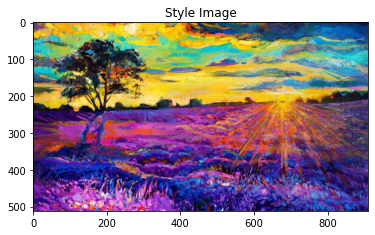

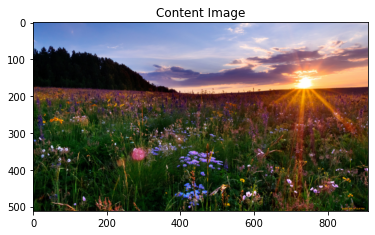

In [ ]:
unloader = transforms.ToPILImage()  # конвертируем в `PIL image`

plt.ion()

def imshow(tensor, title=None):
    image = tensor.cpu().clone()  
    image = image.squeeze(0)      # убираем лишнюю размерность батча
    image = unloader(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)
#     plt.pause(0.001)


plt.figure()
imshow(style_img, title='Style Image')

plt.figure()
imshow(content_img, title='Content Image')

In [ ]:
class ContentLoss(nn.Module):
    def __init__(self, target,):
        super().__init__()
        # detach() используется, чтобы не считать градиенты до target
        self.target = target.detach()
        # убираем градиенты у текущего, иначе будем рассматривать их по всем предыдущим итерациям,
        # так как градиенты накапливаются, а нам нужны они только с текущей итерации.

    def forward(self, input):
        self.loss = F.mse_loss(input, self.target)
        return input

In [ ]:
def gram_matrix(input):
    a, b, c, d = input.size()  # a=batch size(=1)
    # b=number of feature maps
    # (c,d)=dimensions of a f. map (N=c*d)

    features = input.view(a * b, c * d)  # resise F_XL into \hat F_XL

    G = torch.mm(features, features.t())  # compute the gram product

    # we 'normalize' the values of the gram matrix
    # by dividing by the number of element in each feature maps.
    # Нормализуем, так как иначе значения для градиентов изображений разных раземров будут различных порядков,
    # что будет приводить к различным результатам при инференесе (вывод данных из моделе) при различных изображениях.
    return G.div(a * b * c * d)

In [ ]:
class StyleLoss(nn.Module):
    def __init__(self, target_feature, weight = 1.0):
        super().__init__()
        self.target = gram_matrix(target_feature).detach()
        self.weight = weight

    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.mse_loss(G, self.target)
        return input

In [ ]:
cnn = models.vgg19(pretrained=True).features.to(device).eval()
# .eval() убирает dropout и батч нормализации, необходимые при обучении.

In [ ]:
cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

# Делаем модуль для нормализации, чтобы потом без труда стакать в слои
# nn.Sequential
class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        # .view the mean and std to make them [C x 1 x 1] so that they can
        # directly work with image Tensor of shape [B x C x H x W].
        # B is batch size. C is number of channels. H is height and W is width.
        self.mean = torch.tensor(mean).view(-1, 1, 1)
        self.std = torch.tensor(std).view(-1, 1, 1)

    def forward(self, img):
        return (img - self.mean) / self.std

In [ ]:
# Какие именно слои мы хотим использовать чтобы считать наши лоссы
content_layers_default = ['conv_4']
style_layers_default = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']

def get_style_model_and_losses(cnn, normalization_mean, normalization_std,
                               style_img, content_img,
                               content_layers=content_layers_default,
                               style_layers=style_layers_default):
    cnn = copy.deepcopy(cnn)

    # помним, что сначала нормализуем картинки
    normalization = Normalization(normalization_mean, normalization_std).to(device)

    # хотим иметь iterable с вставленными модулями
    content_losses = []
    style_losses = []

    # создаем свою модельку, в которую вставим лоссы
    model = nn.Sequential(normalization)

    i = 0  # increment every time we see a conv
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            # The in-place version doesn't play very nicely with the ContentLoss
            # and StyleLoss we insert below. So we replace with out-of-place
            # ones here.
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        if name in content_layers:
            # добавляем content loss:
            target = model(content_img).detach()
            content_loss = ContentLoss(target)
            model.add_module("content_loss_{}".format(i), content_loss)
            content_losses.append(content_loss)

        if name in style_layers:
            # добавляем style loss:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_{}".format(i), style_loss)
            style_losses.append(style_loss)

    # Обрезаем все слои, которые находятся после последнего ContentLoss или StyleLoss
    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break

    model = model[:(i + 1)]

    return model, style_losses, content_losses

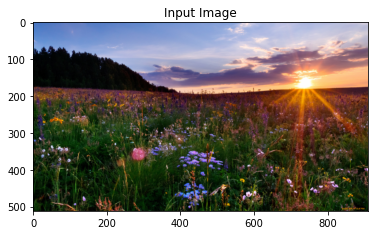

In [ ]:
input_img = content_img.clone()

# если есть желание подать шум, попробуйте эту строчку раскомментить
# input_img = torch.randn(content_img.data.size(), device=device)

plt.figure()
imshow(input_img, title='Input Image')

In [ ]:
def get_input_optimizer(input_img):
    # input_img - это параметры, до которых доходит градиент
    # Так как мы оптимизируем не веса модели, а само изображение, то в оптимизатор подается не
    # model.parameters(), а градиенты нашего изображения (точнее наше изображение, которое нуно рассматривать как 
    # тензор с градиентами для каждого из элементов тензора).
    optimizer = optim.LBFGS([input_img.requires_grad_()])
    return optimizer

In [ ]:
def run_style_transfer(cnn, normalization_mean, normalization_std,
                       content_img, style_img, input_img, num_steps=320,
                       style_weight=1000000, content_weight=1):
    # Соотношение style_weight и content_weight должно отличаться как минимум на 7-8 порядков.
    """ Поехали! """

    print('Building the style transfer model..')
    model, style_losses, content_losses = get_style_model_and_losses(cnn, normalization_mean,
                                                                     normalization_std,
                                                                     style_img, content_img)
    optimizer = get_input_optimizer(input_img)

    print('Optimizing..')
    run = [0]
    while run[0] <= num_steps:

        def closure():
            # корректируем значения, чтобы они лежали в пределах `[0..1]`, так как могут быть выбросы
            input_img.data.clamp_(0, 1)

            optimizer.zero_grad()
            model(input_img)
            style_score = 0
            content_score = 0

            for sl in style_losses:
                style_score += sl.loss

            for cl in content_losses:
                content_score += cl.loss

            style_score *= style_weight
            content_score *= content_weight

            loss = style_score + content_score
            loss.backward()

            run[0] += 1
            if run[0] % 50 == 0:
                print("run {}:".format(run))
                print('Style Loss : {:4f} Content Loss: {:4f}'.format(
                    style_score.item(), content_score.item()))
                print()

                plt.figure(figsize=(8,8))
                imshow(input_img.data.clamp_(0,1), title=f'Output Image at {run}')
                plt.show()

            return style_score + content_score

        optimizer.step(closure)

    # корректируем значения, чтобы они лежали в пределах `[0..1]` для финальной картинки
    input_img.data.clamp_(0, 1)

    return input_img

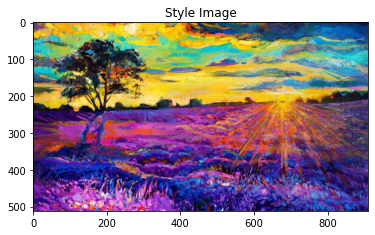

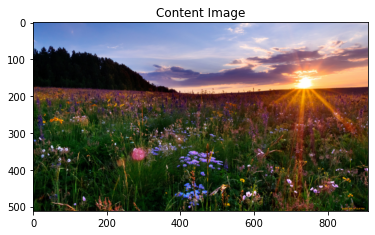

In [ ]:
plt.figure()
imshow(style_img, title='Style Image')

plt.figure()
imshow(content_img, title='Content Image')

Запускаем!


Building the style transfer model..
Optimizing..


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  del sys.path[0]


run [50]:
Style Loss : 252.981674 Content Loss: 44.212280



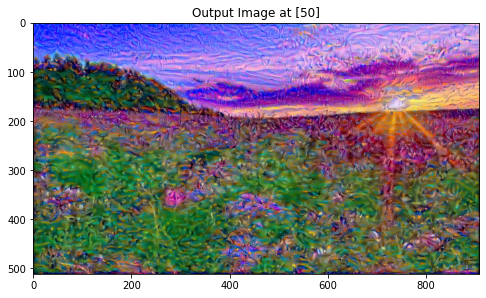

run [100]:
Style Loss : 88.006989 Content Loss: 40.933434



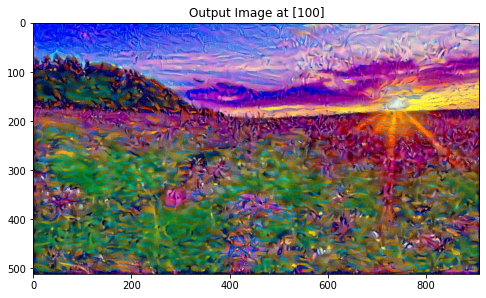

run [150]:
Style Loss : 34.659023 Content Loss: 36.546101



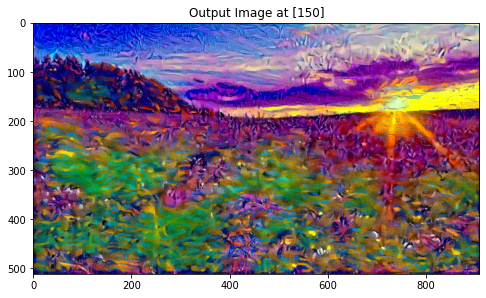

run [200]:
Style Loss : 17.391579 Content Loss: 32.417938



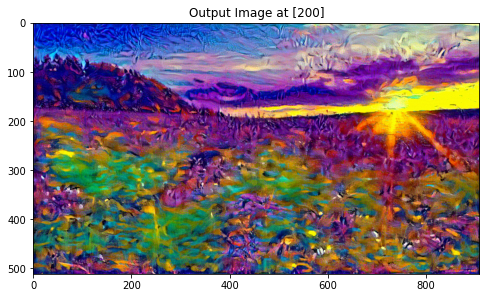

run [250]:
Style Loss : 9.067023 Content Loss: 28.579672



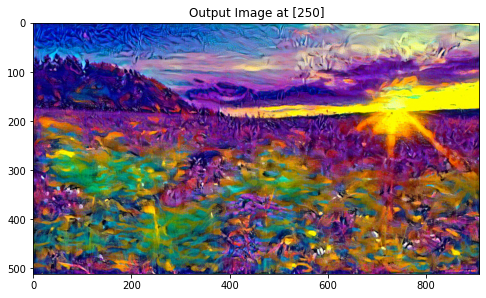

run [300]:
Style Loss : 5.725644 Content Loss: 24.391323



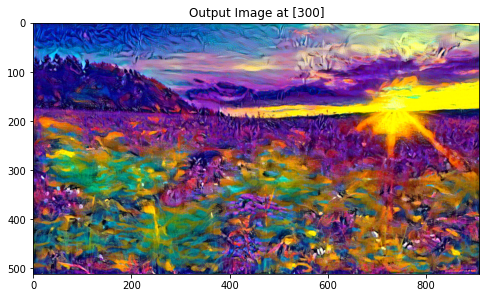

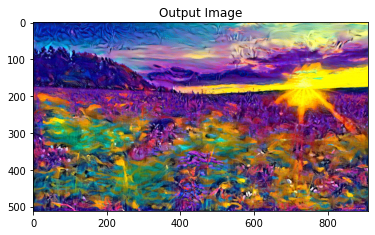

In [ ]:
output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img)

# plt.figure()
imshow(output, title='Output Image')

# plt.ioff()
plt.show()

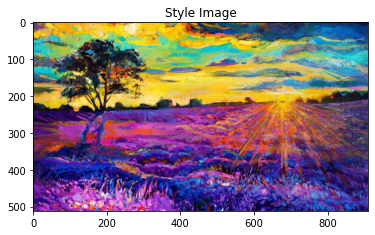

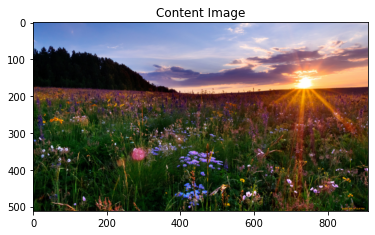

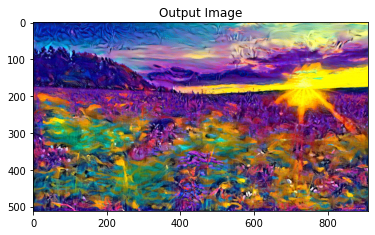

In [ ]:
plt.figure()
imshow(style_img, title='Style Image')

plt.figure()
imshow(content_img, title='Content Image')

plt.figure()
imshow(output, title='Output Image')

*И почему еще никто не додумался продавать такие картины??? Ведь получается просто красота!*



In [ ]:
del input_img
del content_img
del style_img
# del cnn
torch.cuda.empty_cache()

In [ ]:
! nvidia-smi

Tue Apr 12 16:01:24 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   70C    P0    77W / 149W |    694MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Давайте попробуем сделать ещё что-нибудь с какой-нибудь хорошенькой актрисой!

In [ ]:
!wget https://cdni.rbth.com/rbthmedia/images/2021.05/original/60a7cac215e9f9207f4964d4.jpg

--2022-04-12 16:03:24--  https://cdni.rbth.com/rbthmedia/images/2021.05/original/60a7cac215e9f9207f4964d4.jpg
Resolving cdni.rbth.com (cdni.rbth.com)... 178.176.128.128
Connecting to cdni.rbth.com (cdni.rbth.com)|178.176.128.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 791249 (773K) [image/jpeg]
Saving to: ‘60a7cac215e9f9207f4964d4.jpg’

60a7cac215e9f9207f4 100%[===================>] 772.70K  1.01MB/s    in 0.7s    

2022-04-12 16:03:25 (1.01 MB/s) - ‘60a7cac215e9f9207f4964d4.jpg’ saved [791249/791249]



In [ ]:
!wget https://wallbox.ru/resize/1920x1080/wallpapers/main2/201725/1498413150594ff85e8c6093.97216609.jpg

--2022-04-12 15:53:57--  https://wallbox.ru/resize/1920x1080/wallpapers/main2/201725/1498413150594ff85e8c6093.97216609.jpg
Resolving wallbox.ru (wallbox.ru)... 104.21.70.189, 172.67.138.200, 2606:4700:3035::ac43:8ac8, ...
Connecting to wallbox.ru (wallbox.ru)|104.21.70.189|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 201471 (197K) [image/jpeg]
Saving to: ‘1498413150594ff85e8c6093.97216609.jpg’

1498413150594ff85e8 100%[===================>] 196.75K  --.-KB/s    in 0.1s    

2022-04-12 15:53:59 (1.40 MB/s) - ‘1498413150594ff85e8c6093.97216609.jpg’ saved [201471/201471]

--2022-04-12 15:53:59--  https://compass-media.vogue.it/photos/5f9957a4b356b600c66ff601/16:9/w_1920,c_limit/02_Zinaida_Serebriakova_Autoritratto.jpg
Resolving compass-media.vogue.it (compass-media.vogue.it)... 151.101.2.133, 151.101.66.133, 151.101.130.133, ...
Connecting to compass-media.vogue.it (compass-media.vogue.it)|151.101.2.133|:443... connected.
HTTP request sent, awaiting response..

In [ ]:
style_img = image_loader("./60a7cac215e9f9207f4964d4.jpg")
content_img = image_loader("./1498413150594ff85e8c6093.97216609.jpg")

assert style_img.size() == content_img.size(), \
    "Картинки для стиля и для контента должны быть одного размера"

(1920, 1080)
(1920, 1080)


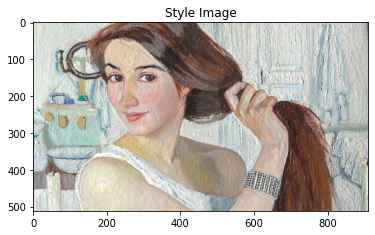

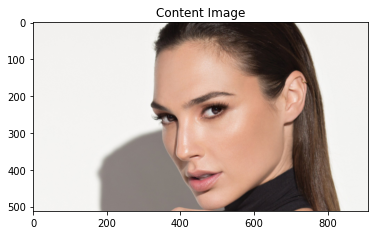

In [ ]:
plt.figure()
imshow(style_img, title='Style Image')

plt.figure()
imshow(content_img, title='Content Image')

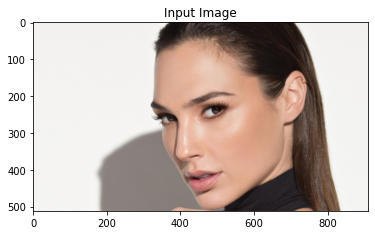

In [ ]:
input_img = content_img.clone()

plt.figure()
imshow(input_img, title='Input Image')

Building the style transfer model..
Optimizing..


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  del sys.path[0]


run [50]:
Style Loss : 26.627052 Content Loss: 17.151438



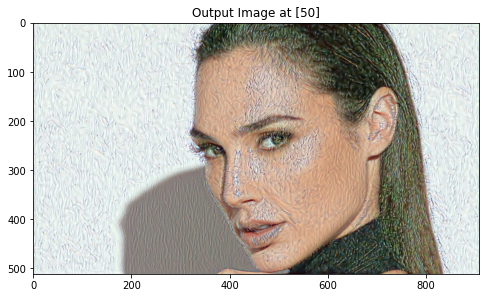

run [100]:
Style Loss : 7.827080 Content Loss: 16.283230



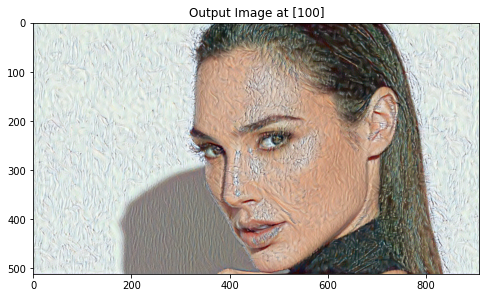

run [150]:
Style Loss : 1.876913 Content Loss: 15.044491



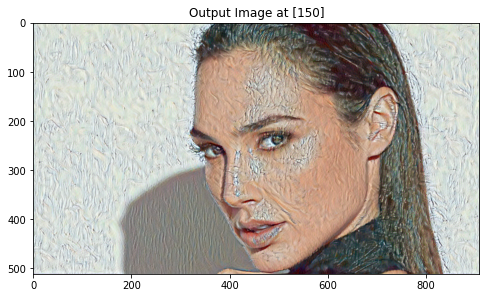

run [200]:
Style Loss : 0.950939 Content Loss: 13.798328



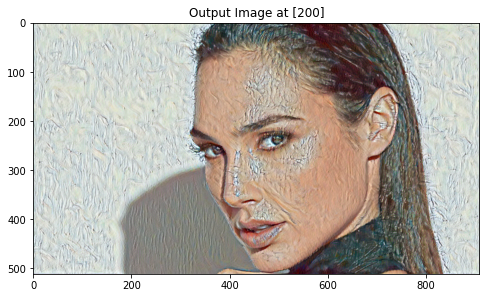

run [250]:
Style Loss : 0.762177 Content Loss: 12.868924



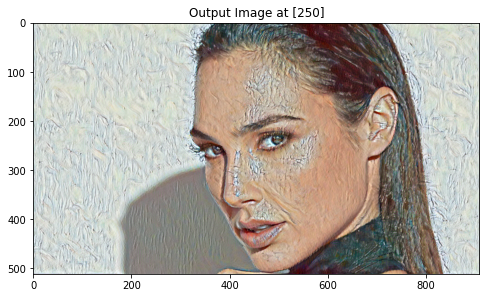

run [300]:
Style Loss : 0.631869 Content Loss: 12.213983



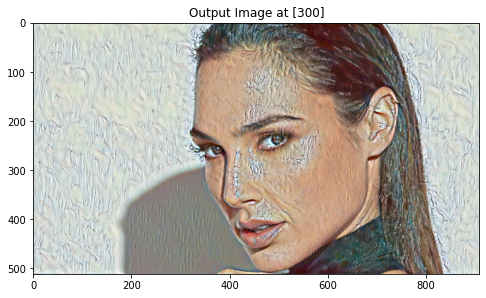

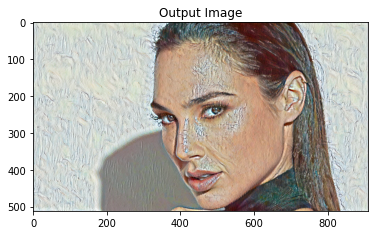

In [ ]:
output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img)

# plt.figure()
imshow(output, title='Output Image')

# plt.ioff()
plt.show()

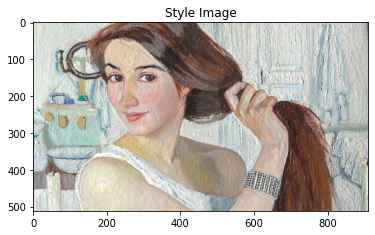

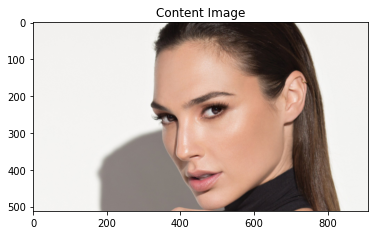

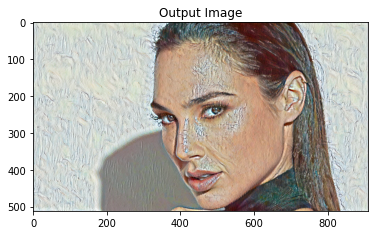

In [ ]:
plt.figure()
imshow(style_img, title='Style Image')

plt.figure()
imshow(content_img, title='Content Image')

plt.figure()
imshow(output, title='Output Image')

Получилось так, будто прекрасная Гал нарисована, но это все как-то простенько...

А теперь для разнообразия попробуем что-то необычное...

In [ ]:
del input_img
del content_img
del style_img
# del cnn
torch.cuda.empty_cache()

In [ ]:
!wget https://media.vogue.fr/photos/5d10dff036e61b119c9b1f5f/16:9/w_1920,c_limit/13_pablo_picasso_nature_morte_avec_fleurs_et_citrons.jpg

--2022-04-12 16:14:36--  https://media.vogue.fr/photos/5d10dff036e61b119c9b1f5f/16:9/w_1920,c_limit/13_pablo_picasso_nature_morte_avec_fleurs_et_citrons.jpg
Resolving media.vogue.fr (media.vogue.fr)... 151.101.2.133, 151.101.66.133, 151.101.130.133, ...
Connecting to media.vogue.fr (media.vogue.fr)|151.101.2.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 533035 (521K) [image/jpeg]
Saving to: ‘13_pablo_picasso_nature_morte_avec_fleurs_et_citrons.jpg’

13_pablo_picasso_na 100%[===================>] 520.54K  --.-KB/s    in 0.04s   

2022-04-12 16:14:37 (14.2 MB/s) - ‘13_pablo_picasso_nature_morte_avec_fleurs_et_citrons.jpg’ saved [533035/533035]



In [ ]:
!wget https://www.cinematographe.it/wp-content/uploads/2018/09/alicia-vikander.jpg

--2022-04-12 16:22:55--  https://www.cinematographe.it/wp-content/uploads/2018/09/alicia-vikander.jpg
Resolving www.cinematographe.it (www.cinematographe.it)... 135.181.216.160
Connecting to www.cinematographe.it (www.cinematographe.it)|135.181.216.160|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 145730 (142K) [image/jpeg]
Saving to: ‘alicia-vikander.jpg.1’

alicia-vikander.jpg 100%[===================>] 142.31K   573KB/s    in 0.2s    

2022-04-12 16:22:56 (573 KB/s) - ‘alicia-vikander.jpg.1’ saved [145730/145730]



In [ ]:
style_img = image_loader("./13_pablo_picasso_nature_morte_avec_fleurs_et_citrons.jpg")
content_img = image_loader("./alicia-vikander.jpg")

assert style_img.size() == content_img.size(), \
    "Картинки для стиля и для контента должны быть одного размера"

(1920, 1080)
(1920, 1080)


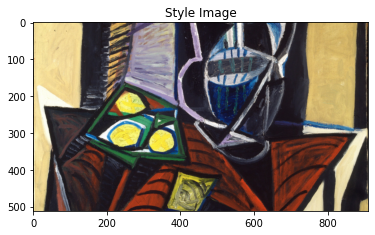

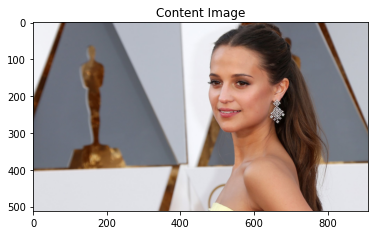

In [ ]:
plt.figure()
imshow(style_img, title='Style Image')

plt.figure()
imshow(content_img, title='Content Image')

Такая фотография выбрана специальна: на заднем фоне есть какие-то геометрические фигурки, может они станут чем-то интересным...

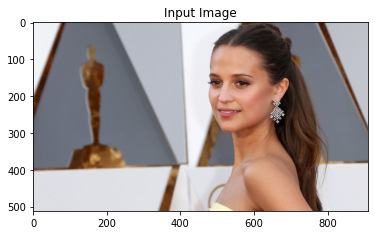

In [ ]:
input_img = content_img.clone()

plt.figure()
imshow(input_img, title='Input Image')

Building the style transfer model..
Optimizing..


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  del sys.path[0]


run [50]:
Style Loss : 80.649422 Content Loss: 10.905423



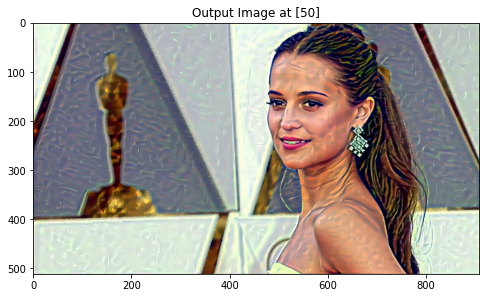

run [100]:
Style Loss : 37.727253 Content Loss: 11.378856



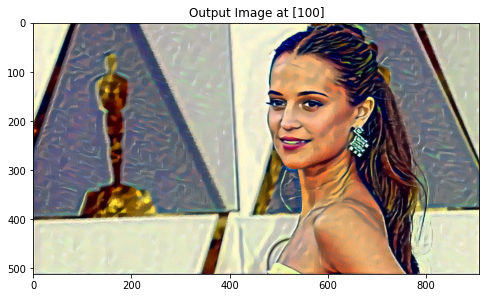

run [150]:
Style Loss : 24.265915 Content Loss: 11.301482



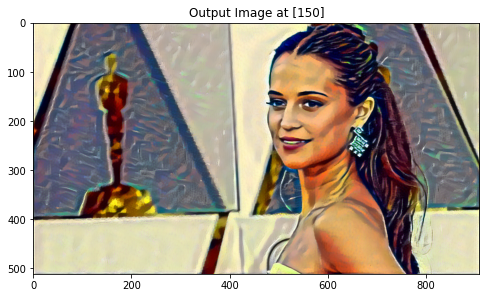

run [200]:
Style Loss : 15.533014 Content Loss: 11.091003



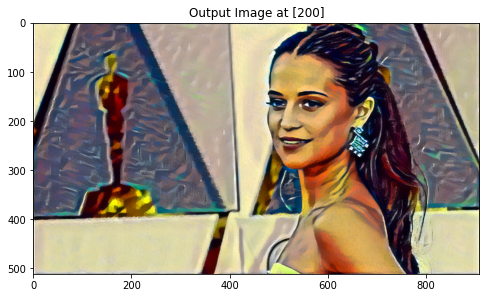

run [250]:
Style Loss : 10.265288 Content Loss: 10.860221



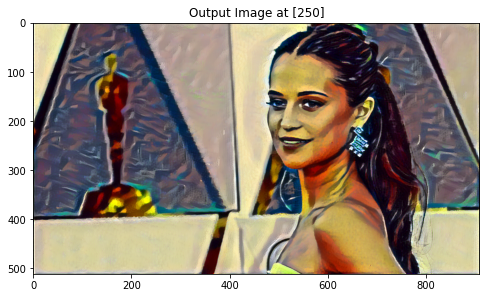

run [300]:
Style Loss : 6.709199 Content Loss: 10.591570



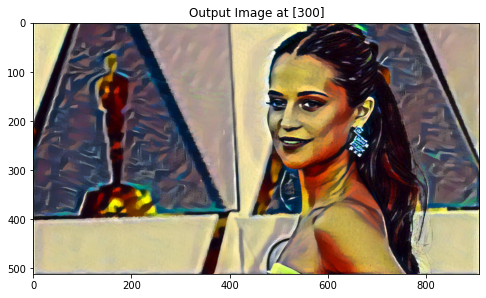

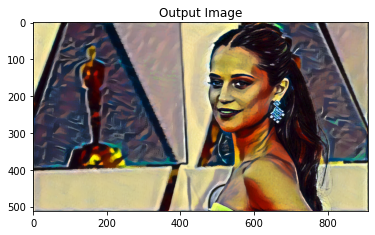

In [ ]:
output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img)

# plt.figure()
imshow(output, title='Output Image')

# plt.ioff()
plt.show()

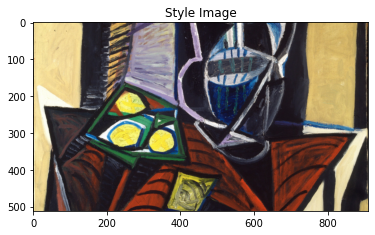

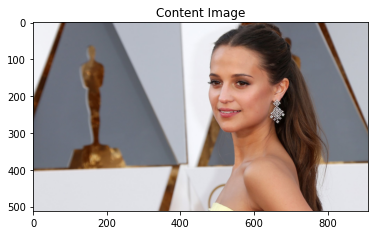

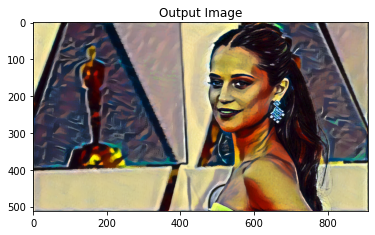

In [ ]:
plt.figure()
imshow(style_img, title='Style Image')

plt.figure()
imshow(content_img, title='Content Image')

plt.figure()
imshow(output, title='Output Image')

Не менее прекрасная Алисия теперь как будто с другой планеты! Это мы любим!

In [ ]:
del input_img
del content_img
del style_img
del cnn
torch.cuda.empty_cache()

На этом всё! Спасибо, что дочитал/дочитала до конца; пожалуйста, что поглядел/поглядела на прекрасное!